## Imports & Requirements

In [9]:
!pip install plotly
!pip install soundfile 
!pip install librosa

In [184]:
import librosa
import librosa.display
import warnings
import contextlib
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [185]:
# Disable warnings
warnings.filterwarnings('ignore')

## Input Parameters & Plotly Environment Setup

In [186]:
filepath = ''
filename = ''
mels_count = 200
max_freq = 16384  # Hz
zvalue_treshold_mel = -15  # dB
mark_peaks = True
camera_mode_3d = True

In [187]:
# load audio data and samplerate 
y, sr = librosa.load(filepath+filename)
# calc playtime duration in seconds 
duration = librosa.get_duration(y=y, sr=sr)

# Passing through arguments to the Mel filters
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=mels_count, fmax=max_freq)
# decibel is measured using the np.max(S) value as a reference point 
mel_data = librosa.power_to_db(S, ref=np.max) # convert spectrum to dB

# data fro plotting spectrogram with log scale instead of mel 
log_data = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)

In [188]:
# caculate sample points for adequate tick labels in plot 
xvalues_count, yvalues_count = len(mel_data[0]), len(mel_data)  # 764, 200

In [189]:
# flat surface on level of zvalue treshold
flat_data = np.full((len(mel_data), len(mel_data[0])), zvalue_treshold_mel)

In [190]:
# plot configurations
config = {'displayModeBar': True,
          'displaylogo': False,
          'modeBarButtonsToRemove': ['orbitRotation', 
                                     'resetCameraDefault3d']}

layout = go.Layout(  # layout of spikes that visualize cursor
    scene=go.layout.Scene(  # position on 3D plot side walls
        xaxis = go.layout.scene.XAxis(showspikes=True, color='white'),
        yaxis = go.layout.scene.YAxis(showspikes=True, color='white'),
        zaxis = go.layout.scene.ZAxis(showspikes=False)))

if (camera_mode_3d == False):
    # 3D camera positioning: TOP VIEW
    camera = dict(up=dict(x=1, y=0, z=0),
                  center=dict(x=0, y=0, z=0),
                  eye=dict(x=0, y=0, z=1))
    
if (camera_mode_3d == True):
    # 3D camera positioning: PERSPECTIVE VIEW
    camera = dict(up=dict(x=0, y=0, z=0),
                  center=dict(x=0, y=0, z=0),
                  eye=dict(x=1, y=1, z=1))

# create custom colorscale for surfaceplot 
colorscale_melspectrum = [[0, 'rgb(0,0,0)'],
                          [0.005, 'rgb(100,100,100)'], 
                          [0.01, 'rgb(0,0,0)'], 
                          [0.3, 'rgb(30,30,30)'], 
                          [0.4, 'rgb(50,50,50)'], 
                          [0.5, 'rgb(80,80,80)'], 
                          [0.75, 'rgb(227, 252, 3)'],
                          [0.9, 'rgb(227, 252, 3)'],
                          [0.975, 'rgb(255,255,255)'],
                          [1, 'rgb(255,255,255)']]

# create custom colorscale for surfaceplot 
colorscale_flat = [[0, 'white'],[1, 'white']]

# contour height level rings for values > treshold 
contours = {"z": {"show": mark_peaks,
                  "start": zvalue_treshold_mel,
                  "end": 0,
                  "size": 1,
                  "color":"black"}}

In [191]:
# CALC correct 3D MEl Spectrogram X-AXIS Tick label texts & positions 
x_tickvals = []
x_ticktext = []

timestep = duration/(10)  # 10x timeslots
xvaluestep = xvalues_count/(10)  # 10x timeslots
xvalue, timevalue = 0, 0

while (xvalue < xvalues_count):
    x_tickvals.append(round(xvalue,2))
    x_ticktext.append(round(timevalue,2))
    xvalue += xvaluestep
    timevalue += timestep

In [192]:
# CALC correct 3D MEl Spectrogram Y-AXIS Tick label texts & positions 
y_tickvals, yvalue = [], 0
y_ticktext = ["0", "512", "1024", "2048", "4096", "8192", "16384"]

while (yvalue <= yvalues_count+1):
    y_tickvals.append(round(yvalue,1))
    yvalue += (yvalues_count/6)

## 3D Mel Spectrogram using Plotly

In [196]:
if (mark_peaks == True):  # plot surface using selected colorscheme, layout and contours
    fig = go.Figure(data=[go.Surface(z=mel_data,  
                                     showscale=True, colorscale=colorscale_melspectrum,
                                     #hovertemplate='<br>%{x} sec<br>%{y} Hz<br>%{z} dB<extra></extra>',
                                     hovertemplate='<br>%{z} dB<extra></extra>',
                                     opacity=1, contours=contours), # colormapped opaque surface
                          go.Surface(z=flat_data, name=f'<br>amplitude<br>treshold', 
                                     # name=f'<br>amplitude<br>treshold<br>{zvalue_treshold_mel} dB',
                                     showscale=False, colorscale=colorscale_flat,
                                     # hovertemplate='<br>%{x} sec<br>%{y} Hz<br>%{z} dB',
                                     hovertemplate='<br>%{z} dB',
                                     opacity=0.4)], layout=layout)  # translucent flat surface
    
if (mark_peaks == False):  # plot surface using selected colorscheme, layout and contours
    fig = go.Figure(data=[go.Surface(z=mel_data, 
                                     showscale=True, colorscale=colorscale_melspectrum,
                                     #hovertemplate='<br>%{x} sec<br>%{y} Hz<br>%{z} dB<extra></extra>',
                                     hovertemplate='<br>%{z} dB<extra></extra>',
                                     opacity=1, contours=contours)], layout=layout)

# background and axis label colors and dimensions 
fig.update_layout(autosize=True, width=950, height=700,
                  paper_bgcolor='rgb(11,11,11)',
                  font_family= 'Arial', # "Courier New",
                  font_color="white",
                  legend_title_font_color="white") 

# replace perspective camera with orthogonal view 
fig.layout.scene.camera.projection.type = "orthographic"
# turntable view of defined camera position
fig.update_layout(scene_aspectmode='manual',
                  scene_camera=camera, 
                  dragmode = "turntable",
                  scene_aspectratio=dict(x=1.5, y=1, z=0.75),
                  
                  scene_zaxis = dict(
                    gridcolor="rgb(055, 055, 055)",
                    showbackground=True,
                    backgroundcolor="rgb(0, 0, 0)",
                    title = 'Volume [dB]'),
                  
                  scene_xaxis = dict(
                    gridcolor="rgb(055, 055, 055)",
                    showbackground=True,
                    backgroundcolor="rgb(0, 0, 0)",
                    title = 'Time [secs]',
                    tickvals = x_tickvals,
                    ticktext = x_ticktext,
                    tickangle = 45),
                  
                  scene_yaxis = dict(
                    gridcolor="rgb(055, 055, 055)",
                    showbackground=True,
                    backgroundcolor="rgb(0, 0, 0)",
                    title = 'Frequency [Hz]',
                    tickvals = y_tickvals,
                    ticktext = y_ticktext)
                 )

# enable x-axis traces without permanent projection
fig.update_traces(contours_x=dict(show=False, usecolormap=False,
                                  highlightcolor= "#e3fc03", #"#ff008d",
                                  highlightwidth=15,
                                  project_x=True))

# define colorbar descriptive title
fig.data[0].colorbar.title = "Amplitude [dB]"

fig.show(config=config)

# Backup: 2D Mel Spectrogram 
Implemented using Matplotlib x Librosa

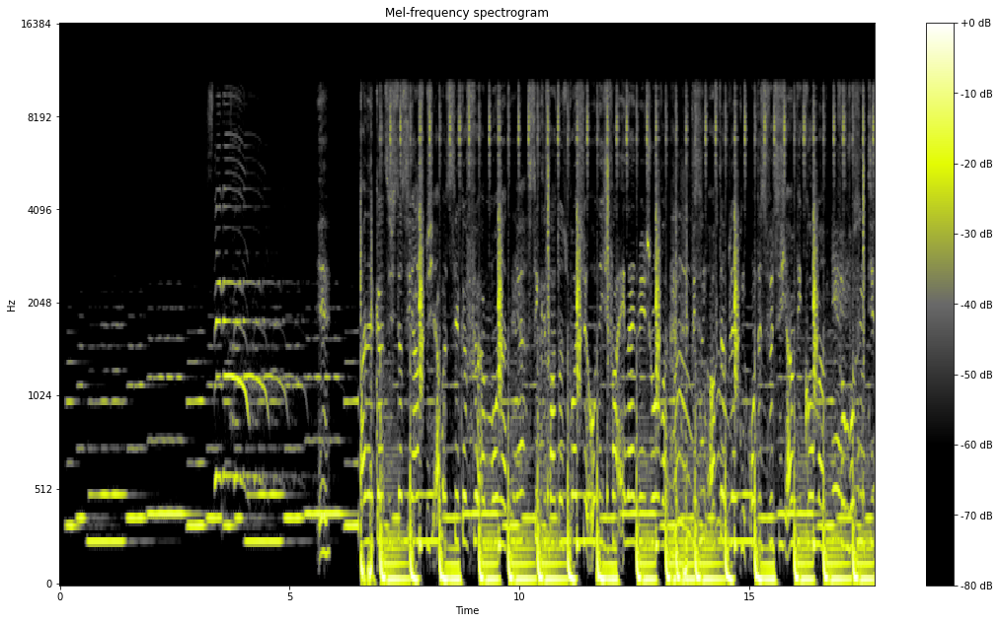

In [194]:
fig, ax = plt.subplots()

cmap_mtpl_mel = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black","black", "dimgrey",
                                                                         "#e3fc03", 'white'])
img = librosa.display.specshow(mel_data, sr=sr, x_axis='time', y_axis='mel', 
                         cmap=cmap_mtpl_mel,fmax=max_freq, ax=ax)

fig.colorbar(img, ax=ax, format='%+2.0f dB')
fig.set_size_inches(18.5, 10.5)
ax.set(title='Mel-frequency spectrogram')

fig.show()

# Backup: 2D Log Spectrogram 
Implemented using Matplotlib x Librosa

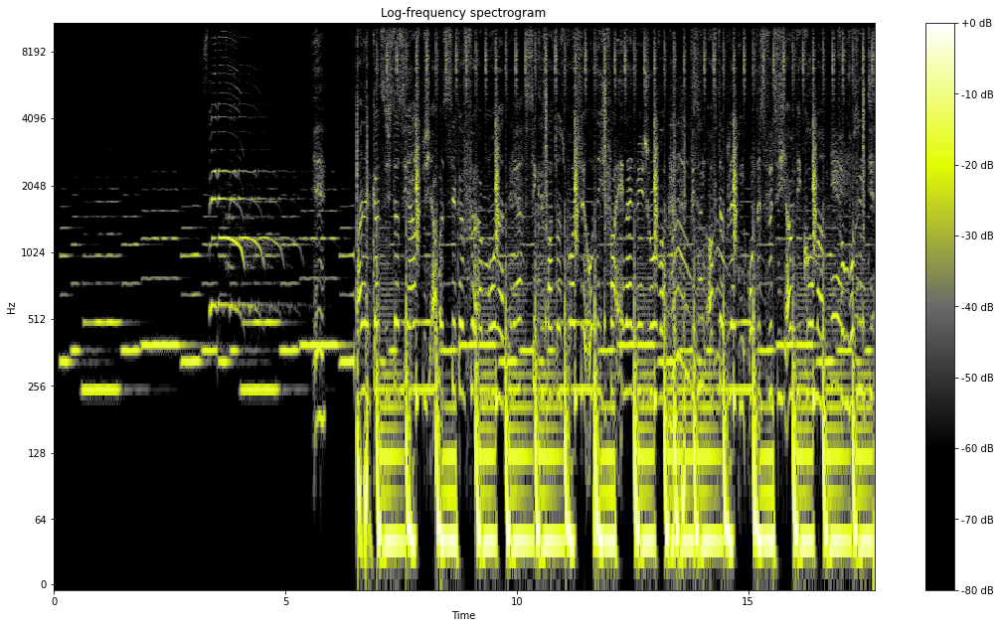

In [195]:
fig, ax = plt.subplots()

cmap_mtpl_mel = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black","black", "dimgrey",
                                                                         "#e3fc03", 'white'])
img = librosa.display.specshow(log_data, y_axis='log', x_axis='time',
                               sr=sr, ax=ax, cmap=cmap_mtpl_mel, fmax=max_freq)

fig.colorbar(img, ax=ax, format='%+2.0f dB')
fig.set_size_inches(18.5, 10.5)
ax.set(title='Log-frequency spectrogram')

fig.show()

# TODO: 

- find way to actually generate a data matrix for the MEL-Spectrogram that not only contains the Z-Amplitude Values but actually tuples that include (amp, freq, time) datapoints --> this would enable the plot to inherently have the right scaling --> this enables to take use of the hovertext value preview for the current cursor position. (instead of only dB, also time and freq are shown on hover)<br><br>

- Calculate the frequency spectrogram using scipy, recalculate the signal to a mel spectrogram and then plot the whole thing --> librosa as a data procesing plugin lacks the opportunity to output all the data and only provides an arrray of zvalues<br><br>

- find out why basically the signal is capped at 8192 Hz? this seems odd